<a href="https://colab.research.google.com/github/gre1wy/Machine_Learning/blob/main/lab2/lab2b_nn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [27]:
import os
import numpy as np
import pandas as pd
import time

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, classification_report

from imblearn.over_sampling import SMOTE



# Math

https://elcaiseri.medium.com/building-a-multi-layer-perceptron-from-scratch-with-numpy-e4cee82ab06d  
https://medium.com/data-science/derivative-of-the-softmax-function-and-the-categorical-cross-entropy-loss-ffceefc081d1

$ L = -\sum_{k=1}^{K} y_k \log(s_k)$  
$s_i = \frac{e^{z_i}}{\sum_{j=1}^{K}e^{z_j}}$  



For output layer:  
$\frac{\partial L}{\partial W_2} $ - ? $\frac{\partial L}{\partial b_2} $ - ?  
$Z_2 = A_1 \cdot W_2 + b_2$  
$\frac{\partial L}{\partial W_2} = \frac{\partial L}{\partial Z_2} \cdot \frac{\partial Z_2}{\partial W_2}$  
$dZ2 = \frac{\partial L}{\partial Z_2} = S - Y$, where S is the softmax output (predicted probabilities) and Y is the one-hot encoded true label vector ([Source](https://medium.com/data-science/derivative-of-the-softmax-function-and-the-categorical-cross-entropy-loss-ffceefc081d1))   
Then $\frac{\partial L}{\partial W_2} = A_1^T \cdot (S - Y)$  
$\frac{\partial L}{\partial b_2} = \frac{\partial L}{\partial Z_2} \cdot \frac{\partial Z_2}{\partial b_2} =  \sum_{i=1}^{m} (S-Y)_i$

For hidden layer:  
$\frac{\partial L}{\partial W_1} $ - ? $\frac{\partial L}{\partial b_1} $ - ?   
$Z_1 = X \cdot W1 + b_1$ , $A_1$ = relu($Z_1$)  
$\frac{\partial L}{\partial W_1} = \frac{\partial L}{\partial A_1} \cdot \frac{\partial A_1}{\partial Z_1} \cdot \frac{\partial Z_1}{\partial W_1} = dZ1 \cdot \frac{\partial Z_1}{\partial W_1}$  
1. $\frac{\partial L}{\partial A_1} = \frac{\partial L}{\partial Z_2} \cdot \frac{\partial Z_2}{\partial A_1}$  
$\frac{\partial L}{\partial Z_2} = S - Y$  
$\frac{\partial Z_2}{\partial A_1} = W_2^T$  
2. $\frac{\partial A_1}{\partial Z_1} = [Z_1>0]$
3. $\frac{\partial Z_1}{\partial W_1} = X^T$  

Then $\frac{\partial L}{\partial W_1} = X^T \cdot ((S - Y) \cdot W_2^T * [Z_1>0])  $ = $X^T \cdot dZ1$

$\frac{\partial L}{\partial b_1} = \frac{\partial L}{\partial A_1} \cdot \frac{\partial A_1}{\partial Z_1} \cdot \frac{\partial Z_1}{\partial b_1} = \sum_{i=1}^{m}((S - Y) \cdot W_2^T * [Z_1>0])_i$

# Part 1

## Load Dataset

Dataset: https://www.kaggle.com/datasets/rabieelkharoua/predicting-manufacturing-defects-dataset/data

In [32]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("fedesoriano/stellar-classification-dataset-sdss17")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'stellar-classification-dataset-sdss17' dataset.
Path to dataset files: /kaggle/input/stellar-classification-dataset-sdss17


In [33]:
csv_file = os.path.join(path, "star_classification.csv")
df = pd.read_csv(csv_file)

## About dataset

**Context**  
In astronomy, stellar classification is the classification of stars based on their spectral characteristics. The classification scheme of galaxies, quasars, and stars is one of the most fundamental in astronomy. The early cataloguing of stars and their distribution in the sky has led to the understanding that they make up our own galaxy and, following the distinction that Andromeda was a separate galaxy to our own, numerous galaxies began to be surveyed as more powerful telescopes were built. This datasat aims to classificate stars, galaxies, and quasars based on their spectral characteristics.

**Content**  
The data consists of 100,000 observations of space taken by the SDSS (Sloan Digital Sky Survey). Every observation is described by 17 feature columns and 1 class column which identifies it to be either a star, galaxy or quasar.

obj_ID = Object Identifier, the unique value that identifies the object in the image catalog used by the CAS  
alpha = Right Ascension angle (at J2000 epoch)  
delta = Declination angle (at J2000 epoch)  
u = Ultraviolet filter in the photometric system  
g = Green filter in the photometric system  
r = Red filter in the photometric system  
i = Near Infrared filter in the photometric system  
z = Infrared filter in the photometric system  
run_ID = Run Number used to identify the specific scan  
rereun_ID = Rerun Number to specify how the image was processed  
cam_col = Camera column to identify the scanline within the run  
field_ID = Field number to identify each field   
spec_obj_ID = Unique ID used for optical spectroscopic objects (this means that 2 different observations with the same spec_obj_ID must share the output class)  
class = object class (galaxy, star or quasar object)  
redshift = redshift value based on the increase in wavelength  
plate = plate ID, identifies each plate in SDSS  
MJD = Modified Julian Date, used to indicate when a given piece of SDSS data   was taken  
fiber_ID = fiber ID that identifies the fiber that pointed the light at the focal plane in each observation



## First Look

In [34]:
df

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,1.237679e+18,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,7778,301,2,581,1.055431e+19,GALAXY,0.000000,9374,57749,438
99996,1.237679e+18,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,7917,301,1,289,8.586351e+18,GALAXY,0.404895,7626,56934,866
99997,1.237668e+18,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,5314,301,4,308,3.112008e+18,GALAXY,0.143366,2764,54535,74
99998,1.237661e+18,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,3650,301,4,131,7.601080e+18,GALAXY,0.455040,6751,56368,470


### Drop not needed columns

In [35]:
df.drop(['obj_ID', 'run_ID', 'rerun_ID', 'cam_col', 'field_ID', 'spec_obj_ID', 'MJD', 'fiber_ID', 'plate'], axis=1, inplace=True)

### Move column class

In [36]:
col = df.pop("class")
df.insert(0, "class", col)

In [37]:
df

,class,alpha,delta,u,g,r,i,z,redshift
0,GALAXY,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,0.634794
1,GALAXY,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,0.779136
2,GALAXY,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,0.644195
3,GALAXY,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,0.932346
4,GALAXY,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,0.116123
...,...,...,...,...,...,...,...,...,...
99995,GALAXY,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,0.000000
99996,GALAXY,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,0.404895
99997,GALAXY,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,0.143366
99998,GALAXY,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,0.455040


## Some information

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   class     100000 non-null  object 
 1   alpha     100000 non-null  float64
 2   delta     100000 non-null  float64
 3   u         100000 non-null  float64
 4   g         100000 non-null  float64
 5   r         100000 non-null  float64
 6   i         100000 non-null  float64
 7   z         100000 non-null  float64
 8   redshift  100000 non-null  float64
dtypes: float64(8), object(1)
memory usage: 6.9+ MB


In [39]:
df["class"].value_counts()

,count
class,
GALAXY,59445
STAR,21594
QSO,18961


In [40]:
df["class"]=[0 if i == "GALAXY" else 1 if i == "STAR" else 2 for i in df["class"]]

## Statistical information

In [41]:
df.describe()

,class,alpha,delta,u,g,r,i,z,redshift
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,0.595160,177.629117,24.135305,21.980468,20.531387,19.645762,19.084854,18.668810,0.576661
std,0.787509,96.502241,19.644665,31.769291,31.750292,1.854760,1.757895,31.728152,0.730707
min,0.000000,0.005528,-18.785328,-9999.000000,-9999.000000,9.822070,9.469903,-9999.000000,-0.009971
25%,0.000000,127.518222,5.146771,20.352353,18.965230,18.135828,17.732285,17.460677,0.054517
50%,0.000000,180.900700,23.645922,22.179135,21.099835,20.125290,19.405145,19.004595,0.424173
75%,1.000000,233.895005,39.901550,23.687440,22.123767,21.044785,20.396495,19.921120,0.704154
max,2.000000,359.999810,83.000519,32.781390,31.602240,29.571860,32.141470,29.383740,7.011245


In [42]:
df.duplicated().sum()

np.int64(0)

## Analysis of target variable


In [43]:
target_variable = 'class'
input_variables = df.columns.drop(target_variable)

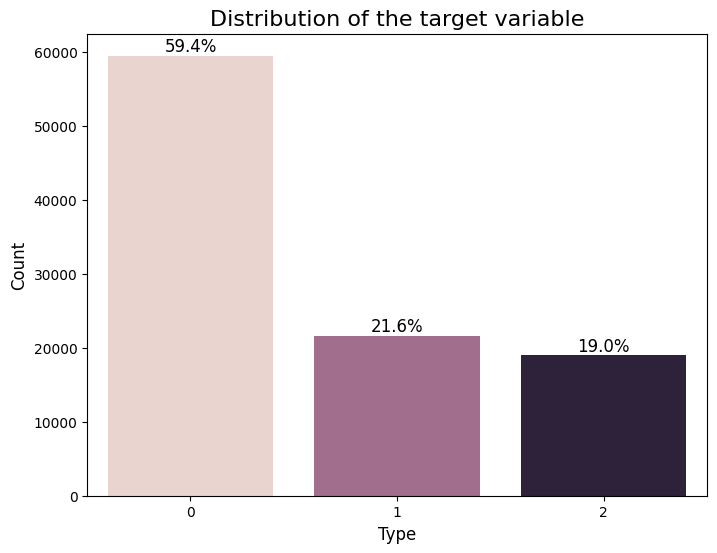

In [44]:
plt.figure(figsize=(8, 6))
ax = sns.countplot(x=target_variable, hue=target_variable, data=df, legend=False)
plt.title('Distribution of the target variable', fontsize=16)
plt.xlabel('Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
total = len(df[target_variable])
for p in ax.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='bottom', fontsize=12)

plt.show()

There is a class imbalance issue.

## Analysis of the distribution of input parameters

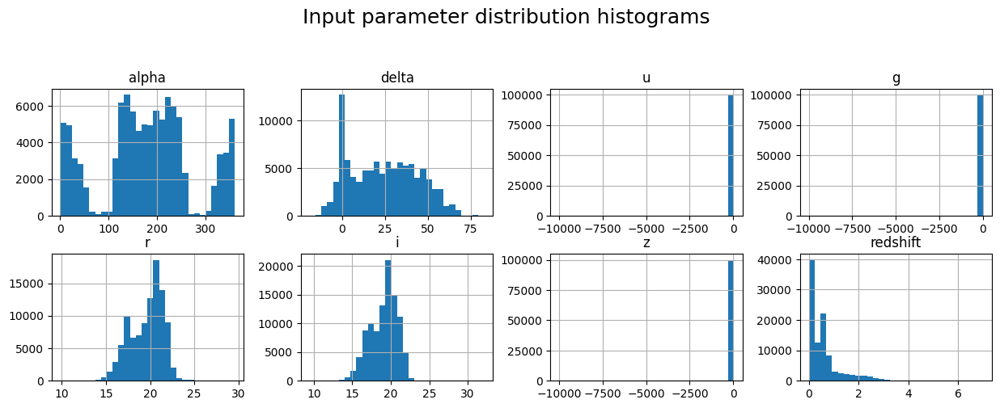

In [45]:
df[input_variables].hist(bins=30, figsize=(15, 10), layout=(4, 4))
plt.suptitle('Input parameter distribution histograms', fontsize=18)
plt.show()

In [46]:
cols = 4
rows = (len(input_variables) + cols - 1) // cols
fig = make_subplots(rows=rows, cols=cols, subplot_titles=input_variables)

for i, col in enumerate(input_variables):
    r = i // cols + 1
    c = i % cols + 1

    fig.add_trace(
        go.Violin(
            y=df[col],
            box_visible=True,
            meanline_visible=True,
            points='outliers',
            name=col,
            line_color='blue',
            fillcolor='lightblue',
            opacity=0.6,
        ),
        row=r,
        col=c
    )

fig.update_layout(
    height=250 * rows,
    width=1200,
    title_text='Input Parameter Distribution',
    showlegend=False
)

fig.show()


### Drop Outliers

In [56]:
cols = ['g', 'z', 'u']
df = df[~(df[cols] == -9999).any(axis=1)]

In [59]:
def rem_outliers(df, factor=1.5):
    dataset = df.copy()
    initial_rows = dataset.shape[0]

    for col in dataset.select_dtypes(include='number').columns:
        q1 = dataset[col].quantile(0.25)
        q3 = dataset[col].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - factor * iqr
        upper = q3 + factor * iqr
        dataset = dataset[(dataset[col] >= lower) & (dataset[col] <= upper)]

    removed = initial_rows - dataset.shape[0]
    return dataset, removed

In [60]:
df_clean, deleted = rem_outliers(df)

In [61]:
print("Number of outliers deleted are : ", deleted)


Number of outliers deleted are :  9399


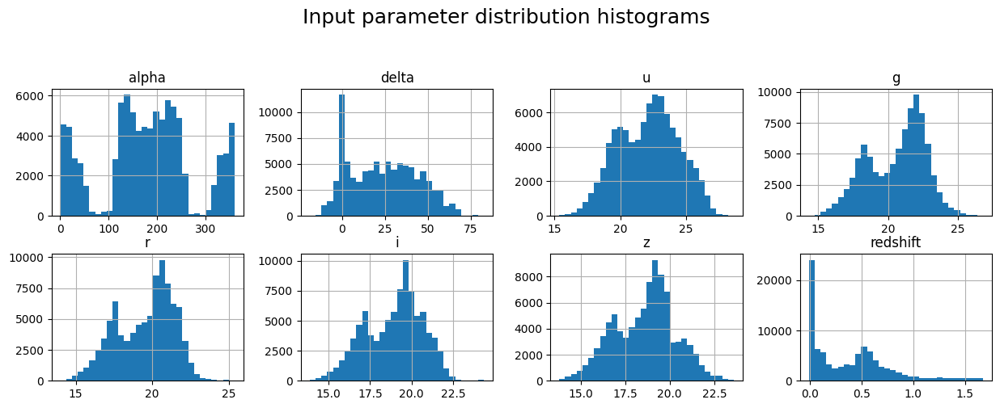

In [62]:
df_clean[input_variables].hist(bins=30, figsize=(15, 10), layout=(4, 4))
plt.suptitle('Input parameter distribution histograms', fontsize=18)
plt.show()

In [63]:
cols = 4
rows = (len(input_variables) + cols - 1) // cols
fig = make_subplots(rows=rows, cols=cols, subplot_titles=input_variables)

for i, col in enumerate(input_variables):
    r = i // cols + 1
    c = i % cols + 1

    fig.add_trace(
        go.Violin(
            y=df_clean[col],
            box_visible=True,
            meanline_visible=True,
            points='outliers',
            name=col,
            line_color='blue',
            fillcolor='lightblue',
            opacity=0.6,
        ),
        row=r,
        col=c
    )

fig.update_layout(
    height=250 * rows,
    width=1200,
    title_text='Input Parameter Distribution',
    showlegend=False
)

fig.show()

## Correlation between input parameters

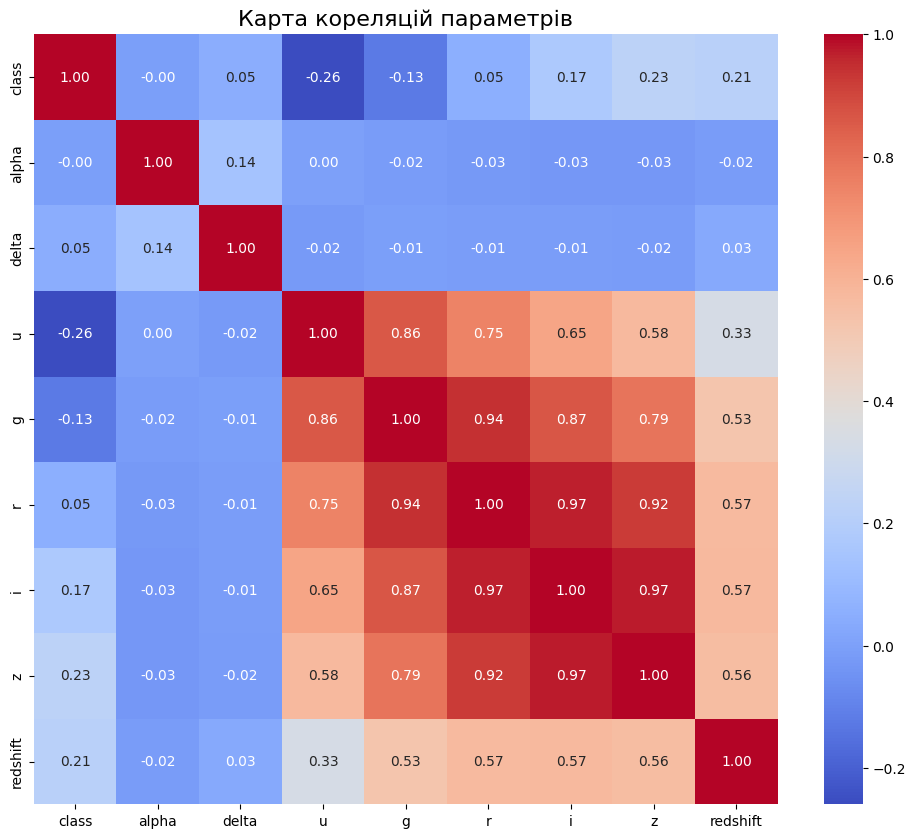

In [64]:
plt.figure(figsize=(12, 10))
correlation_matrix = df_clean.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Карта кореляцій параметрів', fontsize=16)
plt.show()

# Part 2 MLP

## MLP class

In [150]:
class MLP:
    def __init__(self, layer_dims, class_weights=None, random_state=None,
                 optimizer="gd", beta1=0.9, beta2=0.999, eps=1e-8,
                 dropout_rate=0.0):
        """
        Fully connected Multi-Layer Perceptron (MLP)

        layer_dims: list of layer sizes, e.g. [input_dim, hidden1, ..., output_dim]
        optimizer: 'gd' or 'adam'
        dropout_rate: float ∈ [0, 1), fraction of neurons to drop during training
        """
        self.layer_dims = layer_dims
        self.weights = []
        self.biases = []
        self.class_weights = class_weights

        self.optimizer = optimizer.lower()
        self.dropout_rate = dropout_rate
        self.training = True

        # for Adam
        self.beta1 = beta1
        self.beta2 = beta2
        self.eps = eps
        self.t = 0
        self.m = []
        self.v = []

        rng = np.random.default_rng(random_state)
        for i in range(1, len(layer_dims)):
            w = rng.standard_normal((layer_dims[i-1], layer_dims[i])) * np.sqrt(2 / layer_dims[i-1])
            b = np.zeros((1, layer_dims[i]))
            self.weights.append(w)
            self.biases.append(b)
            if self.optimizer == "adam":
                self.m.append({'W': np.zeros_like(w), 'b': np.zeros_like(b)})
                self.v.append({'W': np.zeros_like(w), 'b': np.zeros_like(b)})
            else:
                self.m.append(None)
                self.v.append(None)
    # ===== Activation functions =====
    def _relu(self, Z):
        return np.maximum(0, Z)

    def _relu_derivative(self, Z):
        return (Z > 0).astype(float)

    def _softmax(self, Z):
        expZ = np.exp(Z - np.max(Z, axis=1, keepdims=True))
        return expZ / np.sum(expZ, axis=1, keepdims=True)

    # ===== Forward pass =====
    def forward(self, X):
        cache = {'A0': X}
        A = X
        num_layers = len(self.weights)

        for l in range(num_layers - 1):
            Z = A.dot(self.weights[l]) + self.biases[l]
            A = self._relu(Z)

            # --- Dropout ---
            if self.training and self.dropout_rate > 0:
                D = (np.random.rand(*A.shape) > self.dropout_rate).astype(float)
                A *= D
                A /= (1.0 - self.dropout_rate)
                cache[f'D{l}'] = D

            cache[f'Z{l}'] = Z
            cache[f'A{l+1}'] = A

        Z_last = A.dot(self.weights[-1]) + self.biases[-1]
        A_last = self._softmax(Z_last)
        cache[f'Z{num_layers-1}'] = Z_last
        cache[f'A{num_layers}'] = A_last

        return A_last, cache

    # ===== Loss =====
    def _compute_loss(self, Y_onehot, A_last):
        m = Y_onehot.shape[0]
        ce = -np.sum(Y_onehot * np.log(A_last + 1e-9), axis=1)

        if self.class_weights is not None:
            class_weight_vec = np.array([self.class_weights.get(i, 1.0) for i in range(Y_onehot.shape[1])])
            sample_weights = (Y_onehot * class_weight_vec).sum(axis=1)
            ce *= sample_weights

        return np.mean(ce)

    # ===== Backward pass =====
    def backward(self, Y_onehot, cache):
        grads = {}
        m = Y_onehot.shape[0]
        num_layers = len(self.weights)

        A_last = cache[f'A{num_layers}']
        dZ = A_last - Y_onehot
        if self.class_weights is not None:
            class_weight_vec = np.array([self.class_weights.get(i, 1.0) for i in range(Y_onehot.shape[1])])
            sample_weights = (Y_onehot * class_weight_vec).sum(axis=1)
            dZ *= sample_weights[:, np.newaxis]

        A_prev = cache[f'A{num_layers-1}']
        grads[f'dW{num_layers-1}'] = (A_prev.T @ dZ) / m
        grads[f'db{num_layers-1}'] = np.sum(dZ, axis=0, keepdims=True) / m

        for l in reversed(range(num_layers - 1)):
            dA = dZ @ self.weights[l+1].T

            # --- Dropout backward ---
            if self.training and self.dropout_rate > 0 and f'D{l}' in cache:
                dA *= cache[f'D{l}']
                dA /= (1.0 - self.dropout_rate)

            Z = cache[f'Z{l}']
            dZ = dA * self._relu_derivative(Z)
            A_prev = cache[f'A{l}']
            grads[f'dW{l}'] = (A_prev.T @ dZ) / m
            grads[f'db{l}'] = np.sum(dZ, axis=0, keepdims=True) / m

        return grads

    # ===== Update =====
    def update_params(self, grads, learning_rate):
        self.t += 1
        for l in range(len(self.weights)):
            dW = grads[f'dW{l}']
            db = grads[f'db{l}']

            if self.optimizer == "adam":
                # --- Adam ---
                self.m[l]['W'] = self.beta1 * self.m[l]['W'] + (1 - self.beta1) * dW
                self.m[l]['b'] = self.beta1 * self.m[l]['b'] + (1 - self.beta1) * db
                self.v[l]['W'] = self.beta2 * self.v[l]['W'] + (1 - self.beta2) * (dW ** 2)
                self.v[l]['b'] = self.beta2 * self.v[l]['b'] + (1 - self.beta2) * (db ** 2)

                # Bias correction
                m_hat_W = self.m[l]['W'] / (1 - self.beta1 ** self.t)
                m_hat_b = self.m[l]['b'] / (1 - self.beta1 ** self.t)
                v_hat_W = self.v[l]['W'] / (1 - self.beta2 ** self.t)
                v_hat_b = self.v[l]['b'] / (1 - self.beta2 ** self.t)

                self.weights[l] -= learning_rate * m_hat_W / (np.sqrt(v_hat_W) + self.eps)
                self.biases[l] -= learning_rate * m_hat_b / (np.sqrt(v_hat_b) + self.eps)

            else:
                # --- GD ---
                self.weights[l] -= learning_rate * dW
                self.biases[l] -= learning_rate * db

    # ===== Training =====
    def fit(self, X, y, X_val=None, y_val=None, epochs=1000, learning_rate=0.01,
            show_history=True, patience=20, min_delta=1e-4):
        self.training = True

        encoder = OneHotEncoder(sparse_output=False)
        Y_onehot = encoder.fit_transform(y.reshape(-1, 1))
        if X_val is not None and y_val is not None:
            Y_val_onehot = encoder.transform(y_val.reshape(-1, 1))

        history = {'train_loss': [], 'val_loss': []}
        best_val_loss = float('inf')
        best_weights = [w.copy() for w in self.weights]
        best_biases = [b.copy() for b in self.biases]
        epochs_no_improve = 0
        start_time = time.time()

        for epoch in range(epochs):
            A_last, cache = self.forward(X)
            loss = self._compute_loss(Y_onehot, A_last)
            history['train_loss'].append(loss)

            if X_val is not None:
                A_val, _ = self.forward(X_val)
                val_loss = self._compute_loss(Y_val_onehot, A_val)
                history['val_loss'].append(val_loss)

                if val_loss + min_delta < best_val_loss:
                    best_val_loss = val_loss
                    epochs_no_improve = 0
                    best_weights = [w.copy() for w in self.weights]
                    best_biases = [b.copy() for b in self.biases]
                else:
                    epochs_no_improve += 1
                    if epochs_no_improve >= patience:
                        self.weights = best_weights
                        self.biases = best_biases
                        if show_history:
                            print(f"Early stopping at epoch {epoch} (best val_loss={best_val_loss:.4f})")
                        break

            grads = self.backward(Y_onehot, cache)
            self.update_params(grads, learning_rate)

            if show_history and epoch % 100 == 0:
                elapsed = time.time() - start_time
                h, rem = divmod(elapsed, 3600)
                m, s = divmod(rem, 60)
                msg = f"[{int(h):02d}:{int(m):02d}:{int(s):02d}] Epoch {epoch:4d} | Loss: {loss:.4f}"
                if X_val is not None:
                    msg += f" | Val Loss: {val_loss:.4f}"
                print(msg)

        return history

    # ===== Prediction =====
    def predict(self, X):
        self.training = False
        A_last, _ = self.forward(X)
        return np.argmax(A_last, axis=1)


## Testing

In [69]:
X = df_clean.drop('class', axis=1)
y = df_clean['class'].values

In [111]:
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.2, random_state=42, stratify=y_temp
)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

### Baseline

In [117]:
baseline_model = MLP(layer_dims=[X_train.shape[1], 64, 32, 16, 3], class_weights={0:1, 1:1, 2:1}, random_state=42)
history_baseline = baseline_model.fit(
    X_train,
    y_train,
    X_val,
    y_val,
    epochs=2001,
    learning_rate=0.01
)

[00:00:00] Epoch    0 | Loss: 1.8751 | Val Loss: 1.8818
[00:00:34] Epoch  100 | Loss: 0.6285 | Val Loss: 0.6284
[00:01:15] Epoch  200 | Loss: 0.5149 | Val Loss: 0.5133
[00:01:53] Epoch  300 | Loss: 0.4524 | Val Loss: 0.4495
[00:02:28] Epoch  400 | Loss: 0.4094 | Val Loss: 0.4055
[00:03:02] Epoch  500 | Loss: 0.3769 | Val Loss: 0.3727
[00:03:37] Epoch  600 | Loss: 0.3518 | Val Loss: 0.3476
[00:04:10] Epoch  700 | Loss: 0.3324 | Val Loss: 0.3283
[00:04:44] Epoch  800 | Loss: 0.3170 | Val Loss: 0.3130
[00:05:18] Epoch  900 | Loss: 0.3042 | Val Loss: 0.3003
[00:05:52] Epoch 1000 | Loss: 0.2935 | Val Loss: 0.2896
[00:06:25] Epoch 1100 | Loss: 0.2844 | Val Loss: 0.2805
[00:07:00] Epoch 1200 | Loss: 0.2764 | Val Loss: 0.2723
[00:07:37] Epoch 1300 | Loss: 0.2691 | Val Loss: 0.2650
[00:08:11] Epoch 1400 | Loss: 0.2614 | Val Loss: 0.2576
[00:08:44] Epoch 1500 | Loss: 0.2545 | Val Loss: 0.2507
[00:09:18] Epoch 1600 | Loss: 0.2481 | Val Loss: 0.2444
[00:09:55] Epoch 1700 | Loss: 0.2424 | Val Loss:

In [118]:
y_baseline_pred = baseline_model.predict(X_test)

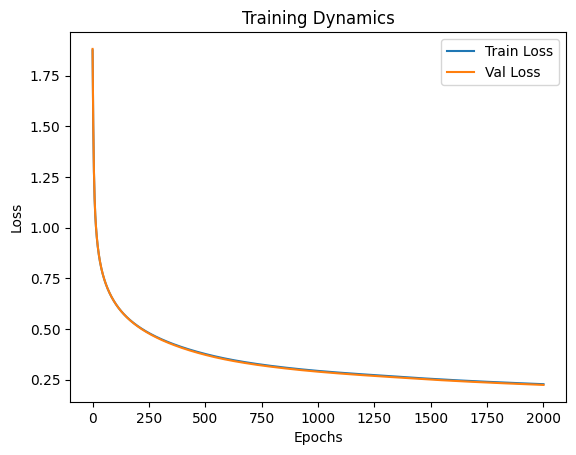

In [119]:
plt.plot(history_baseline["train_loss"], label='Train Loss')
plt.plot(history_baseline["val_loss"], label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Dynamics')
plt.legend()
plt.show()

In [120]:
print(classification_report(y_test, y_baseline_pred, zero_division=0))

              precision    recall  f1-score   support

           0       0.93      0.94      0.94     11889
           1       0.88      0.90      0.89      4319
           2       0.97      0.90      0.93      3792

    accuracy                           0.93     20000
   macro avg       0.92      0.91      0.92     20000
weighted avg       0.93      0.93      0.93     20000



### Balancing weights

In [126]:
weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train, random_state=42)
class_weights = {i : weights[i] for i in range(len(weights))}

weighted_model = MLP(layer_dims=[X_train.shape[1], 64, 32, 16, 3], class_weights=class_weights)
history_weighted = weighted_model.fit(X_train, y_train, X_val, y_val, epochs=2001, learning_rate=0.01)

[00:00:00] Epoch    0 | Loss: 1.2345 | Val Loss: 1.2303
[00:00:43] Epoch  100 | Loss: 0.6648 | Val Loss: 0.6596
[00:01:18] Epoch  200 | Loss: 0.5720 | Val Loss: 0.5652
[00:01:52] Epoch  300 | Loss: 0.5018 | Val Loss: 0.4955
[00:02:26] Epoch  400 | Loss: 0.4282 | Val Loss: 0.4211
[00:03:02] Epoch  500 | Loss: 0.3850 | Val Loss: 0.3779
[00:03:36] Epoch  600 | Loss: 0.3568 | Val Loss: 0.3500
[00:04:14] Epoch  700 | Loss: 0.3366 | Val Loss: 0.3300
[00:04:50] Epoch  800 | Loss: 0.3212 | Val Loss: 0.3148
[00:05:27] Epoch  900 | Loss: 0.3089 | Val Loss: 0.3026
[00:05:59] Epoch 1000 | Loss: 0.2987 | Val Loss: 0.2924
[00:06:33] Epoch 1100 | Loss: 0.2901 | Val Loss: 0.2837
[00:07:05] Epoch 1200 | Loss: 0.2825 | Val Loss: 0.2761
[00:07:49] Epoch 1300 | Loss: 0.2756 | Val Loss: 0.2693
[00:08:22] Epoch 1400 | Loss: 0.2694 | Val Loss: 0.2629
[00:08:56] Epoch 1500 | Loss: 0.2635 | Val Loss: 0.2570
[00:09:31] Epoch 1600 | Loss: 0.2580 | Val Loss: 0.2513
[00:10:06] Epoch 1700 | Loss: 0.2527 | Val Loss:

In [127]:
y_weights_pred = weighted_model.predict(X_test)

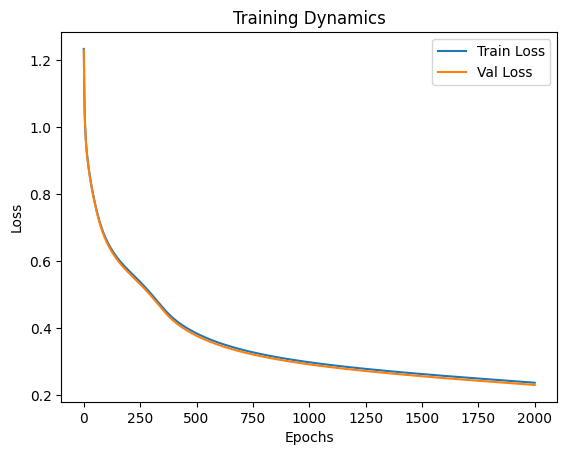

In [130]:
plt.plot(history_weighted["train_loss"], label='Train Loss')
plt.plot(history_weighted["val_loss"], label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Dynamics')
plt.legend()
plt.show()

In [129]:
print(classification_report(y_test, y_weights_pred, zero_division=0))

              precision    recall  f1-score   support

           0       0.96      0.87      0.92     11889
           1       0.76      0.96      0.85      4319
           2       0.93      0.93      0.93      3792

    accuracy                           0.90     20000
   macro avg       0.89      0.92      0.90     20000
weighted avg       0.91      0.90      0.90     20000



### SMOTE (Oversampling)

In [132]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

smote_model = MLP(layer_dims=[X_train.shape[1], 64, 32, 16, 3], class_weights={0: 1, 1: 1, 2:1}, random_state=42)
history_smote = smote_model.fit(X_train_resampled, y_train_resampled, X_val, y_val, epochs=2001, learning_rate=0.01)

[00:00:00] Epoch    0 | Loss: 1.1959 | Val Loss: 1.2433
[00:00:54] Epoch  100 | Loss: 0.5835 | Val Loss: 0.6910
[00:01:56] Epoch  200 | Loss: 0.4358 | Val Loss: 0.5295
[00:02:56] Epoch  300 | Loss: 0.3748 | Val Loss: 0.4582
[00:03:54] Epoch  400 | Loss: 0.3400 | Val Loss: 0.4168
[00:04:47] Epoch  500 | Loss: 0.3167 | Val Loss: 0.3885
[00:05:48] Epoch  600 | Loss: 0.2992 | Val Loss: 0.3670
[00:06:47] Epoch  700 | Loss: 0.2851 | Val Loss: 0.3493
[00:07:42] Epoch  800 | Loss: 0.2732 | Val Loss: 0.3342
[00:08:52] Epoch  900 | Loss: 0.2629 | Val Loss: 0.3209
[00:09:57] Epoch 1000 | Loss: 0.2538 | Val Loss: 0.3091
[00:11:13] Epoch 1100 | Loss: 0.2457 | Val Loss: 0.2985
[00:12:09] Epoch 1200 | Loss: 0.2383 | Val Loss: 0.2889
[00:13:11] Epoch 1300 | Loss: 0.2316 | Val Loss: 0.2800
[00:14:12] Epoch 1400 | Loss: 0.2253 | Val Loss: 0.2718
[00:15:12] Epoch 1500 | Loss: 0.2191 | Val Loss: 0.2638
[00:16:08] Epoch 1600 | Loss: 0.2130 | Val Loss: 0.2561
[00:17:13] Epoch 1700 | Loss: 0.2078 | Val Loss:

### Comparing baseline, weighting, smote

In [136]:
random_states = [0, 33, 325, 238, 1532]
results = []

for seed in random_states:
    print(f"\n===== Random State {seed} =====")

    X_temp, X_test, y_temp, y_test = train_test_split(
        X, y, test_size=0.2, random_state=seed, stratify=y
    )

    X_train, X_val, y_train, y_val = train_test_split(
        X_temp, y_temp, test_size=0.2, random_state=seed, stratify=y_temp
    )

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)
    X_test = scaler.transform(X_test)

    print('--- Baseline ---')
    baseline = MLP([X_train.shape[1], 48, 24, 12, 3], random_state=seed)
    baseline.fit(X_train, y_train, X_val, y_val, epochs=2001, learning_rate=0.01)
    preds_base = baseline.predict(X_test)

    print('--- Model with weights ---')
    weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
    class_weights = {i: weights[i] for i in range(len(weights))}
    weighted = MLP([X_train.shape[1], 48, 24, 12, 3], class_weights=class_weights, random_state=seed)
    weighted.fit(X_train, y_train, X_val, y_val, epochs=2001, learning_rate=0.01)
    preds_weighted = weighted.predict(X_test)

    print('--- Model with SMOTE ---')
    smote = SMOTE(random_state=seed)
    X_res, y_res = smote.fit_resample(X_train, y_train)
    smote_model = MLP([X_train.shape[1], 48, 24, 12, 3], random_state=seed)
    smote_model.fit(X_res, y_res, X_val, y_val, epochs=2001, learning_rate=0.01)
    preds_smote = smote_model.predict(X_test)

    # --- Metrics ---
    f1_base = f1_score(y_test, preds_base, average='macro')
    f1_weighted = f1_score(y_test, preds_weighted, average='macro')
    f1_smote = f1_score(y_test, preds_smote, average='macro')

    acc_base = accuracy_score(y_test, preds_base)
    acc_weighted = accuracy_score(y_test, preds_weighted)
    acc_smote = accuracy_score(y_test, preds_smote)

    results.append({
        'seed': seed,
        'f1_base': f1_base,
        'f1_weighted': f1_weighted,
        'f1_smote': f1_smote,
        'acc_base': acc_base,
        'acc_weighted': acc_weighted,
        'acc_smote': acc_smote
    })



===== Random State 0 =====
--- Baseline ---
[00:00:00] Epoch    0 | Loss: 1.7298 | Val Loss: 1.7221
[00:00:28] Epoch  100 | Loss: 0.7930 | Val Loss: 0.7936
[00:00:55] Epoch  200 | Loss: 0.6366 | Val Loss: 0.6374
[00:01:21] Epoch  300 | Loss: 0.5202 | Val Loss: 0.5203
[00:01:47] Epoch  400 | Loss: 0.4518 | Val Loss: 0.4513
[00:02:15] Epoch  500 | Loss: 0.4080 | Val Loss: 0.4069
[00:02:43] Epoch  600 | Loss: 0.3773 | Val Loss: 0.3755
[00:03:09] Epoch  700 | Loss: 0.3541 | Val Loss: 0.3517
[00:03:38] Epoch  800 | Loss: 0.3356 | Val Loss: 0.3327
[00:04:06] Epoch  900 | Loss: 0.3204 | Val Loss: 0.3171
[00:04:35] Epoch 1000 | Loss: 0.3075 | Val Loss: 0.3039
[00:05:02] Epoch 1100 | Loss: 0.2964 | Val Loss: 0.2925
[00:05:29] Epoch 1200 | Loss: 0.2866 | Val Loss: 0.2824
[00:05:58] Epoch 1300 | Loss: 0.2777 | Val Loss: 0.2733
[00:06:27] Epoch 1400 | Loss: 0.2696 | Val Loss: 0.2650
[00:06:56] Epoch 1500 | Loss: 0.2621 | Val Loss: 0.2573
[00:07:22] Epoch 1600 | Loss: 0.2551 | Val Loss: 0.2502
[00

In [137]:
results_df = pd.DataFrame(results)
print(results_df)
print("\n Mean values:")
print(results_df.mean(numeric_only=True))


   seed   f1_base  f1_weighted  f1_smote  acc_base  acc_weighted  acc_smote
0     0  0.912479     0.901546  0.900185   0.92045       0.90670    0.90545
1    33  0.902780     0.897917  0.898274   0.91195       0.90270    0.90305
2   325  0.914156     0.906699  0.906030   0.92170       0.91095    0.91025
3   238  0.925233     0.913987  0.913586   0.93235       0.91965    0.91920
4  1532  0.908242     0.899802  0.899142   0.91685       0.90450    0.90390

 Mean values:
seed            425.600000
f1_base           0.912578
f1_weighted       0.903990
f1_smote          0.903443
acc_base          0.920660
acc_weighted      0.908900
acc_smote         0.908370
dtype: float64


Surprisingly, the basic version performed the best.

## Final model

In [140]:
X = df_clean.drop('class', axis=1)
y = df_clean['class'].values

In [141]:
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=55, stratify=y
)

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.2, random_state=55, stratify=y_temp
)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

### Final model Adam

In [152]:
final_model = MLP(layer_dims=[X_train.shape[1], 128, 64, 32, 16, 3], random_state=55, optimizer="adam", dropout_rate=0.1)
history_final = final_model.fit(
    X_train,
    y_train,
    X_val,
    y_val,
    epochs=2001,
    learning_rate=0.01
)

[00:00:03] Epoch    0 | Loss: 1.1994 | Val Loss: 1.2001
[00:02:00] Epoch  100 | Loss: 0.1486 | Val Loss: 0.1554
[00:04:05] Epoch  200 | Loss: 0.1145 | Val Loss: 0.1193
Early stopping at epoch 273 (best val_loss=0.1088)


In [153]:
y_final_pred = final_model.predict(X_test)

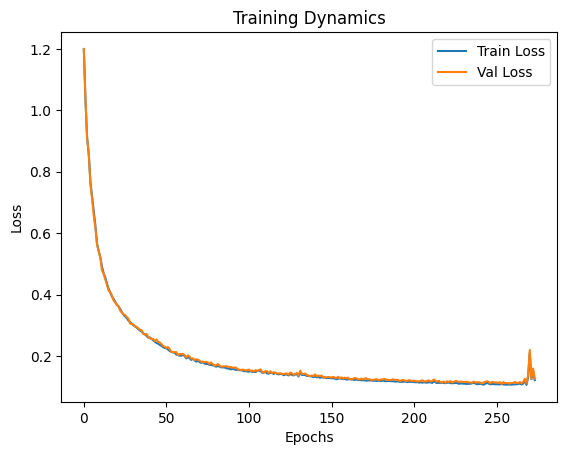

In [154]:
plt.plot(history_final["train_loss"], label='Train Loss')
plt.plot(history_final["val_loss"], label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Dynamics')
plt.legend()
plt.show()

In [157]:
print(classification_report(y_test, y_final_pred, zero_division=0, digits=3))

              precision    recall  f1-score   support

           0      0.976     0.973     0.975     11889
           1      0.961     0.998     0.979      4319
           2      0.958     0.928     0.942      3792

    accuracy                          0.970     20000
   macro avg      0.965     0.966     0.965     20000
weighted avg      0.970     0.970     0.969     20000



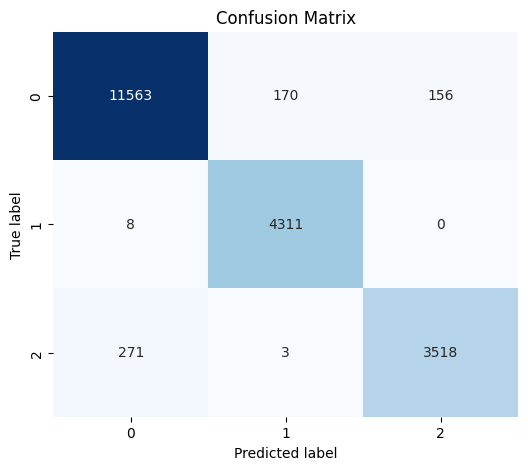

In [158]:
cm = confusion_matrix(y_test, y_final_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.show()

### Final model Gradient Descent

In [159]:
final_model = MLP(layer_dims=[X_train.shape[1], 128, 64, 32, 16, 3], random_state=55, optimizer="gd", dropout_rate=0.1)
history_final = final_model.fit(
    X_train,
    y_train,
    X_val,
    y_val,
    epochs=2001,
    learning_rate=0.01
)

[00:00:04] Epoch    0 | Loss: 1.1967 | Val Loss: 1.1991
[00:02:57] Epoch  100 | Loss: 0.8772 | Val Loss: 0.8724
[00:05:38] Epoch  200 | Loss: 0.7571 | Val Loss: 0.7551
[00:08:05] Epoch  300 | Loss: 0.6531 | Val Loss: 0.6492
[00:10:12] Epoch  400 | Loss: 0.5911 | Val Loss: 0.5810
[00:12:24] Epoch  500 | Loss: 0.5417 | Val Loss: 0.5366
[00:14:23] Epoch  600 | Loss: 0.5115 | Val Loss: 0.5080
Early stopping at epoch 614 (best val_loss=0.5006)


## Conclusions

In this laboratory work, a fully connected **Multi-Layer Perceptron (MLP)** was implemented from scratch.
The model included **ReLU activations** for the hidden layers and **Softmax** for the output layer, enabling multi-class classification.

The network architecture was designed to be flexible — the number and size of hidden layers could be defined as a list of layer dimensions.
Two optimization algorithms were implemented:

- Gradient Descent (GD)

- Adam Optimizer, which known for faster convergence and greater stability.

To improve generalization and reduce overfitting, **Dropout regularization** was integrated into the model.
Additionally, class imbalance was analyzed in the dataset. Two techniques were tested to address it:

- **Class weighting** — assigning higher loss weights to underrepresented classes.

- **SMOTE (Synthetic Minority Over-sampling Technique)** — generating synthetic samples for minority classes.

Surprisingly, the **baseline model without balancing methods achieved slightly better** overall performance compared to both class-weighted and SMOTE-enhanced versions.
This suggests that the original data distribution already contained sufficient representation of all classes, and artificial balancing may have introduced additional noise.

The final model used the following architecture:

>Input layer  
Dropout (0.2)  
Hidden layer 1 — 128 neurons  
Dropout (0.2)  
Hidden layer 2 — 64 neurons  
Dropout (0.2)  
Hidden layer 3 — 32 neurons  
Dropout (0.2)  
Hidden layer 4 — 16 neurons  
Output layer — 3 neurons (Softmax)

The final results on the test set were:

- Accuracy: 0.97

- Macro F1-score: 0.965

These results demonstrate that the implemented MLP effectively learned the underlying data patterns, achieved high classification quality, and generalized well to unseen data.

